In [1]:
!conda install pytorch torchvision torchaudio cpuonly -c pytorch

^C


In [2]:
!pip install pycocotools

In [3]:
!pip install scikit-learn

In [58]:
import os
import json
from PIL import Image
import torch
from torchvision.io import read_image
from torchvision.transforms import functional as F
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader
from pycocotools.coco import COCO
from sklearn.model_selection import train_test_split

In [60]:
# Specify paths to train and test data
TRAIN_IMG_DIR = 'tomatOD_images/train/'  # original train pix
TEST_IMG_DIR = 'tomatOD_images/test/'    # orig test pix
TRAIN_ANN_FILE = 'tomatOD_annotations/tomatOD_train.json'  # Path to orig train
TEST_ANN_FILE = 'tomatOD_annotations/tomatOD_test.json'    # Path to orig test

# Load COCO datasets for train and test
train_coco = COCO(TRAIN_ANN_FILE)
test_coco = COCO(TEST_ANN_FILE)

# Display basic statistics for train dataset
train_image_ids = train_coco.getImgIds()
train_annotations = train_coco.loadAnns(train_coco.getAnnIds())
print(f"Train Dataset - Number of Images: {len(train_image_ids)}")
print(f"Train Dataset - Number of Annotations: {len(train_annotations)}")

# Display basic statistics for test dataset
test_image_ids = test_coco.getImgIds()
test_annotations = test_coco.loadAnns(test_coco.getAnnIds())
print(f"Test Dataset - Number of Images: {len(test_image_ids)}")
print(f"Test Dataset - Number of Annotations: {len(test_annotations)}")

# Perform 80-10-10 split
train_ids, val_ids = train_test_split(train_image_ids, test_size=0.1, random_state=42)  # 10% for validation
print(f"Train set: {len(train_ids)} images")
print(f"Validation set: {len(val_ids)} images")
print(f"Test set: {len(test_image_ids)} images")

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Train Dataset - Number of Images: 222
Train Dataset - Number of Annotations: 1953
Test Dataset - Number of Images: 55
Test Dataset - Number of Annotations: 468
Train set: 199 images
Validation set: 23 images
Test set: 55 images


In [11]:
# Define the custom dataset class
class TomatoDataset(Dataset):
    def __init__(self, img_dir, ann_file, image_ids=None, transform=None):
        """
        Args:
            img_dir (str): Directory containing the images.
            ann_file (str): Path to the COCO annotation file.
            image_ids (list, optional): List of image IDs to include in this subset.
            transform (callable, optional): Transformations to apply to the images.
        """
        self.img_dir = img_dir
        self.transform = transform
        self.coco = COCO(ann_file)
        self.image_ids = image_ids if image_ids is not None else self.coco.getImgIds()

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        """
        Retrieve an image and its annotations.

        Args:
            idx (int): Index of the image.

        Returns:
            image (torch.Tensor): Transformed image tensor.
            target (dict): Dictionary with 'boxes' (bounding boxes) and 'labels' (class labels).
        """
        # Load image information
        img_id = self.image_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_dir, img_info['file_name'])
        image = Image.open(img_path).convert("RGB")  # Load image as PIL Image

        # Load annotations
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        annotations = self.coco.loadAnns(ann_ids)

        # Extract bounding boxes and labels
        boxes = [ann['bbox'] for ann in annotations]
        labels = [ann['category_id'] for ann in annotations]

        # Normalize bounding boxes relative to image size
        img_width, img_height = img_info['width'], img_info['height']
        boxes = [
            [
                bbox[0] / img_width,
                bbox[1] / img_height,
                (bbox[0] + bbox[2]) / img_width,
                (bbox[1] + bbox[3]) / img_height,
            ]
            for bbox in boxes
        ]

        # Convert bounding boxes and labels to tensors
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        target = {'boxes': boxes, 'labels': labels}

        # Apply transformations to the image
        if self.transform:
            image = self.transform(image)

        return image, target

In [17]:
# Create train-val-test datasets
train_dataset = TomatoDataset(img_dir=TRAIN_IMG_DIR, ann_file=TRAIN_ANN_FILE, image_ids=train_ids)
val_dataset = TomatoDataset(
    img_dir=TRAIN_IMG_DIR,
    ann_file=TRAIN_ANN_FILE,
    image_ids=val_ids
)
test_dataset = TomatoDataset(img_dir=TEST_IMG_DIR, ann_file=TEST_ANN_FILE, image_ids=test_image_ids)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [23]:
import os
import json

def filter_annotations(input_ann_file, output_ann_file, image_ids):
    """
    Filters annotations for a given set of image IDs and saves a new JSON file.

    Arguments:
    - input_ann_file: Path to the original annotation JSON file.
    - output_ann_file: Path where the filtered annotations will be saved.
    - image_ids: Set of image IDs to include.
    """

    # Ensure the output directory exists
    os.makedirs(os.path.dirname(output_ann_file), exist_ok=True)

    # Load the original COCO annotations
    with open(input_ann_file, "r") as f:
        coco_data = json.load(f)

    # Create new annotation structure
    filtered_data = {
        "images": [],
        "annotations": [],
        "categories": coco_data["categories"]
    }

    # Create a mapping from old image IDs to new sequential ones
    image_id_map = {}
    new_image_id = 0

    for img in coco_data["images"]:
        if img["id"] in image_ids:  # Keep only selected images
            image_id_map[img["id"]] = new_image_id  # Assign new sequential ID
            img["id"] = new_image_id
            filtered_data["images"].append(img)
            new_image_id += 1

    # Filter annotations to only include selected image IDs
    for ann in coco_data["annotations"]:
        if ann["image_id"] in image_ids:
            ann["image_id"] = image_id_map[ann["image_id"]]  # Update ID mapping
            filtered_data["annotations"].append(ann)

    # Save the filtered annotations
    with open(output_ann_file, "w") as f:
        json.dump(filtered_data, f, indent=4)

    print(f"Filtered annotations saved to {output_ann_file} with {len(filtered_data['images'])} images.")


In [89]:
# Saving Train Annotations
filter_annotations(
    input_ann_file=TRAIN_ANN_FILE,
    output_ann_file="exported_annotations/annotations_train.json",
    image_ids=set(train_ids)  # Convert list to set for faster lookup
)

Filtered annotations saved to exported_annotations/annotations_train.json with 199 images.


In [91]:
# Saving Val Annotations
filter_annotations(
    input_ann_file=TRAIN_ANN_FILE,
    output_ann_file="exported_annotations/annotations_val.json",
    image_ids=set(val_ids)  # Convert list to set for faster lookup
)

Filtered annotations saved to exported_annotations/annotations_val.json with 23 images.


In [93]:
# Saving Test Annotations
filter_annotations(
    input_ann_file=TEST_ANN_FILE,
    output_ann_file="exported_annotations/annotations_test.json",
    image_ids=set(test_image_ids)  # Convert list to set for faster lookup
)

Filtered annotations saved to exported_annotations/annotations_test.json with 55 images.


In [79]:
import os
import shutil
import json

def export_images_from_annotations(image_dir, annotation_file, output_dir):
    """
    Exports images based on the given annotation JSON file.

    Arguments:
    - image_dir: Path to the folder containing the original images.
    - annotation_file: Path to the COCO-style JSON annotation file.
    - output_dir: Directory where images will be copied.

    The function:
    - Extracts image file names from the annotation file.
    - Ensures the output directory exists.
    - Copies the images from `image_dir` to `output_dir`.
    """

    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Load the annotation file
    with open(annotation_file, "r") as f:
        coco_data = json.load(f)

    # Create a mapping of image ID to file name
    id_to_file_name = {str(img["id"]): img["file_name"] for img in coco_data["images"]}

    # Export the images
    copied_count = 0
    for img_id, file_name in id_to_file_name.items():
        src_path = os.path.join(image_dir, file_name)  # ✅ Uses user-defined `image_dir`
        dest_path = os.path.join(output_dir, file_name)

        # Ensure the source file exists before copying
        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)
            copied_count += 1
        else:
            print(f"Warning: Image {src_path} not found!")

    print(f"✅ Exported {copied_count}/{len(id_to_file_name)} images to {output_dir}")


In [69]:
exported_train_imgs = 'exported_images/train/'  # exported train pix (after split)
exported_val_imgs = 'exported_images/val/'  # exported val pix (after split)
exported_test_imgs = 'exported_images/test/'  # exported test pix (after split)

In [50]:
exported_train_ann = 'exported_annotations/annotations_train.json'  # exported train pix (after split)
exported_val_ann = 'exported_annotations/annotations_val.json'  # exported val pix (after split)
exported_test_ann = 'exported_annotations/annotations_test.json'  # exported test pix (after split)

In [83]:
# Export images after split - train
export_images_from_annotations(
    image_dir=TRAIN_IMG_DIR,  # Path to the original image folder
    annotation_file=exported_train_ann,  # Path to the annotation JSON file
    output_dir=exported_train_imgs  # Where to copy images
)

✅ Exported 199/199 images to exported_images/train/


In [85]:
# Export images after split - val
export_images_from_annotations(
    image_dir=TRAIN_IMG_DIR,  # Path to the original image folder
    annotation_file=exported_val_ann,  # Path to the annotation JSON file
    output_dir=exported_val_imgs  # Where to copy images
)

✅ Exported 23/23 images to exported_images/val/


In [87]:
# Export images after split - test
export_images_from_annotations(
    image_dir=TEST_IMG_DIR,  # Path to the original image folder
    annotation_file=exported_test_ann,  # Path to the annotation JSON file
    output_dir=exported_test_imgs  # Where to copy images
)

✅ Exported 55/55 images to exported_images/test/


In [52]:
import json
import pandas as pd
import matplotlib.pyplot as plt

# Define dataset annotation files
train_ann_file = exported_train_ann  # Replace with your actual path
val_ann_file = exported_val_ann
test_ann_file = exported_test_ann

# Function to count occurrences of each class
def count_classes(ann_file):
    with open(ann_file, "r") as f:
        data = json.load(f)

    # Extract category counts
    category_counts = {}
    for ann in data["annotations"]:
        category_id = ann["category_id"]
        category_counts[category_id] = category_counts.get(category_id, 0) + 1

    return category_counts

# Count classes in train, val, and test datasets
train_class_counts = count_classes(train_ann_file)
val_class_counts = count_classes(val_ann_file)
test_class_counts = count_classes(test_ann_file)

# Convert to DataFrame for easy viewing
df_class_distribution_aftersplit = pd.DataFrame({
    "Train": train_class_counts,
    "Validation": val_class_counts,
    "Test": test_class_counts
}).fillna(0).astype(int)

df_class_distribution_aftersplit


,Train,Validation,Test
1,1140,161,292
3,300,32,99
2,299,21,77


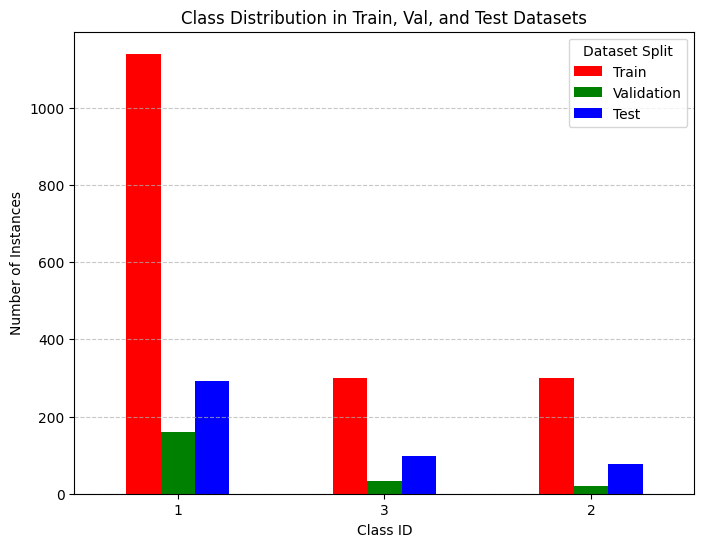

In [54]:
# Plot class distributions
df_class_distribution_aftersplit.plot(kind="bar", figsize=(8,6), color=["red", "green", "blue"])
plt.xlabel("Class ID")
plt.ylabel("Number of Instances")
plt.title("Class Distribution in Train, Val, and Test Datasets")
plt.xticks(rotation=0)
plt.legend(title="Dataset Split")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


In [64]:
# Count classes in train, val, and test datasets
orig_train_class_counts = count_classes(TRAIN_ANN_FILE)
orig_test_class_counts = count_classes(TEST_ANN_FILE)

# Convert to DataFrame for easy viewing
df_class_distribution_orig = pd.DataFrame({
    "Train": orig_train_class_counts,
    "Test": orig_test_class_counts
}).fillna(0).astype(int)

df_class_distribution_orig

,Train,Test
1,1301,292
3,332,99
2,320,77


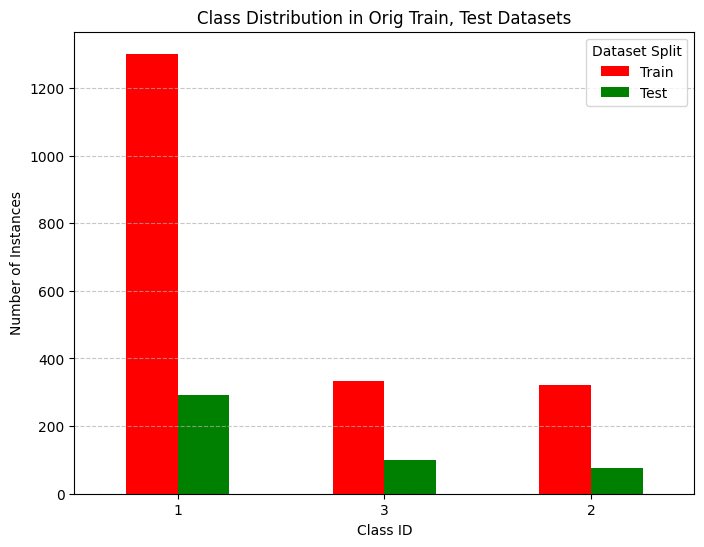

In [68]:
# Plot class distributions
df_class_distribution_orig.plot(kind="bar", figsize=(8,6), color=["red", "green", "blue"])
plt.xlabel("Class ID")
plt.ylabel("Number of Instances")
plt.title("Class Distribution in Orig Train, Test Datasets")
plt.xticks(rotation=0)
plt.legend(title="Dataset Split")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


## Pascal VOC

In [17]:
def format_text_file(file_path):
    """
    Reads a text file, extracts only the filename without the path and extension,
    and saves the modified content to a new file one directory up from its original location.

    Args:
        file_path (str): Path to the input text file.

    Returns:
        str: Path to the modified text file.
    """
    # Get the original directory and filename
    original_dir = os.path.dirname(file_path)
    parent_dir = os.path.dirname(original_dir)  # Move one folder up
    output_file_name = os.path.basename(file_path).replace(".txt", "_formatted.txt")
    output_file_path = os.path.join(parent_dir, output_file_name)

    with open(file_path, "r") as file:
        lines = file.readlines()

    # Extract only the filename without extension
    formatted_lines = [os.path.splitext(os.path.basename(line.strip()))[0] + "\n" for line in lines]

    with open(output_file_path, "w") as file:
        file.writelines(formatted_lines)

    return output_file_path

In [19]:
format_text_file("data/Datasets/CCROP/ImageSets/orig/train.txt")
format_text_file("data/Datasets/CCROP/ImageSets/orig/test.txt")
format_text_file("data/Datasets/CCROP/ImageSets/orig/val.txt")

'data/Datasets/CCROP/ImageSets\\val_formatted.txt'

In [82]:
import os

# Define the paths to the text files
train_txt_path = "data/Datasets/PascalVOC/VOC2007/ImageSets/train.txt"
val_txt_path = "data/Datasets/PascalVOC/VOC2007/ImageSets/val.txt"
test_txt_path = "data/Datasets/PascalVOC/VOC2007/ImageSets/test.txt"

# Function to save filenames (without extension) to txt
def save_filenames_to_txt(dataset, txt_file_path):
    with open(txt_file_path, 'w') as f:
        for idx in range(len(dataset)):  # Loop through the dataset
            img, _ = dataset[idx]  # Access the image (assuming _ is annotation info)
            
            # Get the image path directly (img_path should be the full path)
            img_id = dataset.image_ids[idx]  # Access image ID
            img_info = dataset.coco.loadImgs(img_id)[0]  # Access image information from coco
            filename = os.path.splitext(img_info['file_name'])[0]  # Get filename without extension
            
            # Write the filename (without extension) to the text file
            f.write(f"{filename}\n")

save_filenames_to_txt(train_dataset, train_txt_path)
print(f"Saved {len(train_dataset)} training images to {train_txt_path}")

save_filenames_to_txt(val_dataset, val_txt_path)
print(f"Saved {len(val_dataset)} validation images to {val_txt_path}")

save_filenames_to_txt(test_dataset, test_txt_path)
print(f"Saved {len(test_dataset)} test images to {test_txt_path}")


Saved 199 training images to data/Datasets/PascalVOC/VOC2007/ImageSets/train.txt
Saved 23 validation images to data/Datasets/PascalVOC/VOC2007/ImageSets/val.txt
Saved 55 test images to data/Datasets/PascalVOC/VOC2007/ImageSets/test.txt


In [69]:
import os
from PIL import Image

# Function to export images from the dataset
def export_images(dataset, target_dir):
    os.makedirs(target_dir, exist_ok=True)  # Create the target directory if it doesn't exist

    for idx in range(len(dataset)):  # Loop through the dataset
        img, _ = dataset[idx]  # Access the image from the dataset 
        
        # Get image file name or image id 
        img_id = dataset.image_ids[idx]  # Access image_id directly from dataset 
        
        # Define the target image filename (in JPEG format)
        new_filename = f"{int(img_id):06d}.jpeg"  # Format img_id as 6 digits and save as .jpeg
        new_img_path = os.path.join(target_dir, new_filename)

        try:
            # If img is already a PIL Image object (dataset returns an image object)
            if isinstance(img, Image.Image):
                img.convert("RGB").save(new_img_path, "JPEG")  # Convert and save as JPEG
            else:
                # If dataset returns image paths, open the image
                img = Image.open(img)  # Open the image file
                img.convert("RGB").save(new_img_path, "JPEG")  # Save it as JPEG
            print(f"Exported {new_filename}")
        except Exception as e:
            print(f"Error exporting {img_id}: {e}")

# Export the images from each dataset to the target directories
export_images(train_dataset, 'data/exported_images/train')
export_images(val_dataset, 'data/exported_images/val')
export_images(test_dataset, 'data/exported_images/test')

Exported 000083.jpeg
Exported 000137.jpeg
Exported 000068.jpeg
Exported 000084.jpeg
Exported 000212.jpeg
Exported 000146.jpeg
Exported 000088.jpeg
Exported 000116.jpeg
Exported 000023.jpeg
Exported 000135.jpeg
Exported 000193.jpeg
Exported 000138.jpeg
Exported 000177.jpeg
Exported 000243.jpeg
Exported 000263.jpeg
Exported 000100.jpeg
Exported 000172.jpeg
Exported 000173.jpeg
Exported 000147.jpeg
Exported 000272.jpeg
Exported 000106.jpeg
Exported 000153.jpeg
Exported 000092.jpeg
Exported 000187.jpeg
Exported 000118.jpeg
Exported 000145.jpeg
Exported 000094.jpeg
Exported 000124.jpeg
Exported 000182.jpeg
Exported 000175.jpeg
Exported 000046.jpeg
Exported 000032.jpeg
Exported 000224.jpeg
Exported 000225.jpeg
Exported 000240.jpeg
Exported 000158.jpeg
Exported 000037.jpeg
Exported 000026.jpeg
Exported 000204.jpeg
Exported 000244.jpeg
Exported 000256.jpeg
Exported 000139.jpeg
Exported 000007.jpeg
Exported 000069.jpeg
Exported 000226.jpeg
Exported 000168.jpeg
Exported 000108.jpeg
Exported 0000

In [49]:
export_images(train_dataset, 'data/all')
export_images(val_dataset, 'data/all')
export_images(test_dataset, 'data/all')

Exported 000083.jpeg
Exported 000137.jpeg
Exported 000068.jpeg
Exported 000084.jpeg
Exported 000212.jpeg
Exported 000146.jpeg
Exported 000088.jpeg
Exported 000116.jpeg
Exported 000023.jpeg
Exported 000135.jpeg
Exported 000193.jpeg
Exported 000138.jpeg
Exported 000177.jpeg
Exported 000243.jpeg
Exported 000263.jpeg
Exported 000100.jpeg
Exported 000172.jpeg
Exported 000173.jpeg
Exported 000147.jpeg
Exported 000272.jpeg
Exported 000106.jpeg
Exported 000153.jpeg
Exported 000092.jpeg
Exported 000187.jpeg
Exported 000118.jpeg
Exported 000145.jpeg
Exported 000094.jpeg
Exported 000124.jpeg
Exported 000182.jpeg
Exported 000175.jpeg
Exported 000046.jpeg
Exported 000032.jpeg
Exported 000224.jpeg
Exported 000225.jpeg
Exported 000240.jpeg
Exported 000158.jpeg
Exported 000037.jpeg
Exported 000026.jpeg
Exported 000204.jpeg
Exported 000244.jpeg
Exported 000256.jpeg
Exported 000139.jpeg
Exported 000007.jpeg
Exported 000069.jpeg
Exported 000226.jpeg
Exported 000168.jpeg
Exported 000108.jpeg
Exported 0000

## COCO

In [73]:
import os
import shutil
import json
from pycocotools.coco import COCO

# Define original image paths
TRAIN_IMG_DIR = "data/images/train/"
TEST_IMG_DIR = "data/images/test/"
TRAIN_ANN_FILE = "data/annotations/tomatOD_train.json"
TEST_ANN_FILE = "data/annotations/tomatOD_test.json"

# Define export directories
EXPORT_DIR = "data/Datasets/COCO"
TRAIN_EXPORT_IMG_DIR = os.path.join(EXPORT_DIR, "train/images")
VAL_EXPORT_IMG_DIR = os.path.join(EXPORT_DIR, "val/images")
TEST_EXPORT_IMG_DIR = os.path.join(EXPORT_DIR, "test/images")

TRAIN_EXPORT_ANN_FILE = os.path.join(EXPORT_DIR, "train/annotations.json")
VAL_EXPORT_ANN_FILE = os.path.join(EXPORT_DIR, "val/annotations.json")
TEST_EXPORT_ANN_FILE = os.path.join(EXPORT_DIR, "test/annotations.json")

# Create directories if they don't exist
os.makedirs(TRAIN_EXPORT_IMG_DIR, exist_ok=True)
os.makedirs(VAL_EXPORT_IMG_DIR, exist_ok=True)
os.makedirs(TEST_EXPORT_IMG_DIR, exist_ok=True)

# Load datasets
train_coco = COCO(TRAIN_ANN_FILE)
test_coco = COCO(TEST_ANN_FILE)

# Function to copy images based on split
def copy_images(image_ids, coco, source_dir, dest_dir):
    for img_id in image_ids:
        img_info = coco.loadImgs(img_id)[0]
        src_path = os.path.join(source_dir, img_info["file_name"])
        dest_path = os.path.join(dest_dir, img_info["file_name"])

        # Ensure the image exists before copying
        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)
        else:
            print(f"Warning: Image {src_path} not found!")

# Copy images for each dataset
copy_images(train_ids, train_coco, TRAIN_IMG_DIR, TRAIN_EXPORT_IMG_DIR)
copy_images(val_ids, train_coco, TRAIN_IMG_DIR, VAL_EXPORT_IMG_DIR)
copy_images(test_image_ids, test_coco, TEST_IMG_DIR, TEST_EXPORT_IMG_DIR)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [78]:
def save_annotations(dataset, output_file):
    """Saves dataset annotations in COCO format."""
    new_annotations = {
        "images": dataset.coco.dataset["images"],
        "annotations": dataset.coco.dataset["annotations"],
        "categories": dataset.coco.dataset["categories"]
    }
    with open(output_file, "w") as f:
        json.dump(new_annotations, f, indent=4)

# Save annotation files
save_annotations(train_dataset, TRAIN_EXPORT_ANN_FILE)
save_annotations(val_dataset, VAL_EXPORT_ANN_FILE)
save_annotations(test_dataset, TEST_EXPORT_ANN_FILE)

## Visualization from "Preprocessing"

In [51]:
# Define custom collate function for batching
def collate_fn(batch):
    return tuple(zip(*batch))

In [53]:
# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)

# Print DataLoader sizes
print(f"Train batches: {len(train_loader)}")
print(f"Validation batches: {len(val_loader)}")
print(f"Test batches: {len(test_loader)}")


Train batches: 50
Validation batches: 6
Test batches: 14


In [55]:
# Example: Display a single batch from the train DataLoader
for images, targets in train_loader:
    print("Batch of images (train):", images)
    print("Batch of targets (train):", targets)
    break

Batch of images (train): (<PIL.Image.Image image mode=RGB size=2000x2000 at 0x1F402A7E220>, <PIL.Image.Image image mode=RGB size=2000x2000 at 0x1F402A7E3A0>, <PIL.Image.Image image mode=RGB size=2000x2000 at 0x1F402A7E1C0>, <PIL.Image.Image image mode=RGB size=2000x2000 at 0x1F402A7E3D0>)
Batch of targets (train): ({'boxes': tensor([[0.8055, 0.7135, 0.8435, 0.7515],
        [0.4040, 0.2325, 0.4500, 0.2785],
        [0.0860, 0.7010, 0.1270, 0.7420],
        [0.6905, 0.5385, 0.7405, 0.5885],
        [0.1225, 0.5220, 0.1635, 0.5630],
        [0.1170, 0.3490, 0.1580, 0.3900],
        [0.2675, 0.0710, 0.3175, 0.1210],
        [0.3995, 0.4025, 0.4495, 0.4525],
        [0.1110, 0.7205, 0.1520, 0.7615],
        [0.6465, 0.9465, 0.6965, 0.9965],
        [0.6505, 0.7780, 0.7095, 0.8370]]), 'labels': tensor([3, 1, 2, 3, 3, 1, 1, 1, 1, 1, 1])}, {'boxes': tensor([[0.0590, 0.2150, 0.1280, 0.2840],
        [0.6920, 0.7955, 0.7600, 0.8635],
        [0.5665, 0.6225, 0.6075, 0.6635],
        [0.5265, 0.

In [57]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Class names for the labels (update based on your dataset)
CLASS_NAMES = {1: "Unripe", 2: "Semi-ripe", 3: "Fully-ripe"}
CLASS_COLORS = {1: "green", 2: "orange", 3: "red"}

def visualize(image, boxes, labels):
    """
    Visualize a single image with its bounding boxes and labels.
    Args:
        image (torch.Tensor): Image tensor in [C, H, W] format.
        boxes (torch.Tensor): Bounding boxes in [x_min, y_min, x_max, y_max] format (normalized).
        labels (torch.Tensor): Class labels for the bounding boxes.
    """
    image = T.ToTensor()(image)

    # Convert tensor image to numpy array
    image = image.permute(1, 2, 0).numpy()  # [H, W, C]

    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.imshow(image)

    # Plot bounding boxes and labels
    for box, label in zip(boxes, labels):
        x_min, y_min, x_max, y_max = box
        color = CLASS_COLORS.get(label.item(), "black")  # Get color based on label
        
        # Draw the bounding box
        rect = patches.Rectangle(
            (x_min * image.shape[1], y_min * image.shape[0]),
            (x_max - x_min) * image.shape[1],
            (y_max - y_min) * image.shape[0],
            linewidth=2,
            edgecolor=color,
            facecolor="none",
        )
        ax.add_patch(rect)

        # Add label text
        label_name = CLASS_NAMES.get(label.item(), "Unknown")
        ax.text(
            x_min * image.shape[1],
            y_min * image.shape[0] - 5,
            label_name,
            color="yellow",
            fontsize=12,
            bbox=dict(facecolor=color, alpha=0.5),
        )

    plt.axis("off")
    plt.show()



Train


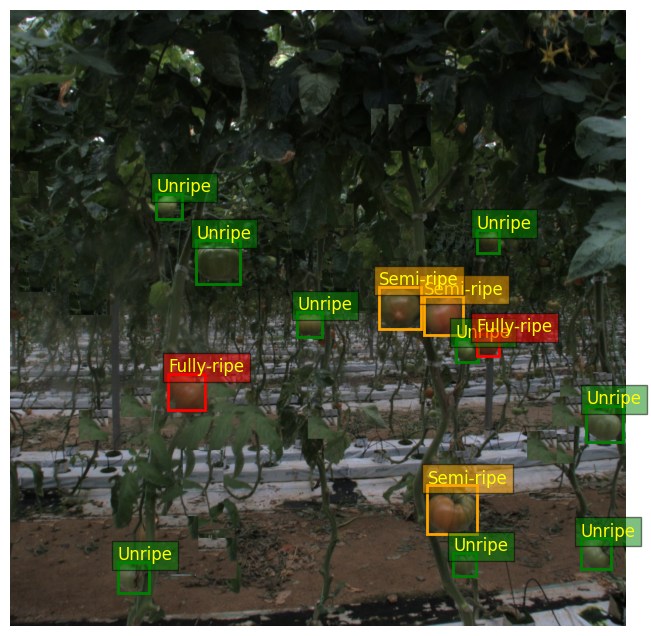

Validation


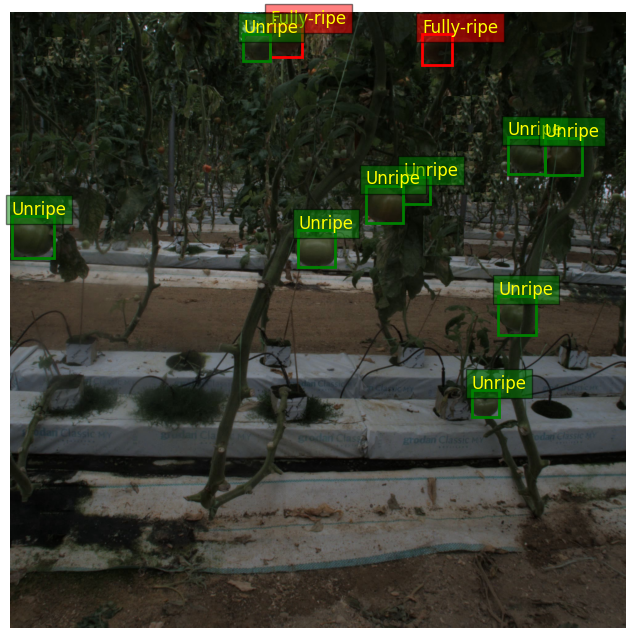

Test


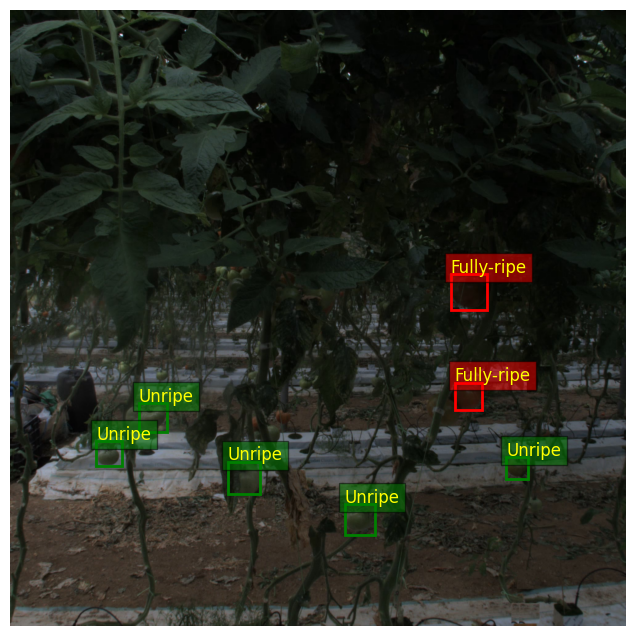

In [59]:
# Example: Display an image from the train DataLoader
print("Train")
for images, targets in train_loader:
    visualize(images[0], targets[0]['boxes'], targets[0]['labels'])
    break

print("Validation")
# Visualize an image from the validation DataLoader
for images, targets in val_loader:
    visualize(images[0], targets[0]['boxes'], targets[0]['labels'])
    break

print("Test")
# Example: Display an image from the test DataLoader
for images, targets in test_loader:
    visualize(images[0], targets[0]['boxes'], targets[0]['labels'])
    break

## Visualization Testing Results (using json files)

In [5]:
from pycocotools.coco import COCO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import json
import os

In [15]:
# Paths to files
annotations_path = 'data/Datasets/Tomatod/annotations_test.json'  # Ground truth annotations
detections_path = "tests/100/detections.json"    # Model predictions
images_dir = "data/Datasets/Tomatod/images/test"                 # Directory containing images


In [17]:
# Load COCO datasets
coco_gt = COCO(annotations_path)  # Ground truth annotations
with open(detections_path, "r") as f:
    detections = json.load(f)  # Load detections as a dictionary

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [19]:
# Load an image and visualize detections
def visualize_image(image_id):
    """
    Visualize the detections and ground truth for a specific image.
    
    Args:
        image_id: The ID of the image to visualize.
    """
    # Load image metadata
    img_info = coco_gt.loadImgs(image_id)[0]
    img_path = os.path.join(images_dir, img_info["file_name"])
    
    # Load and display the image
    img = plt.imread(img_path)
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.axis("off")
    
    # Create a plot
    ax = plt.gca()

    # Plot ground truth annotations
    ann_ids = coco_gt.getAnnIds(imgIds=image_id)
    anns = coco_gt.loadAnns(ann_ids)
    for ann in anns:
        bbox = ann["bbox"]
        x, y, width, height = bbox
        rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor="green", facecolor="none")
        ax.add_patch(rect)
        plt.text(x, y - 5, coco_gt.loadCats(ann["category_id"])[0]["name"], color="green", fontsize=12)
    
    # Plot detections
    for det in detections:
        if det["image_id"] == image_id:
            bbox = det["bbox"]
            x, y, width, height = bbox
            score = det["score"]
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor="red", facecolor="none")
            ax.add_patch(rect)
            plt.text(x, y - 15, f"Pred: {det['category_id']} ({score:.2f})", color="red", fontsize=12)
    
    plt.title(f"Image ID: {image_id}")
    plt.show()


In [21]:
image_ids = coco_gt.getImgIds()  # Get all image IDs

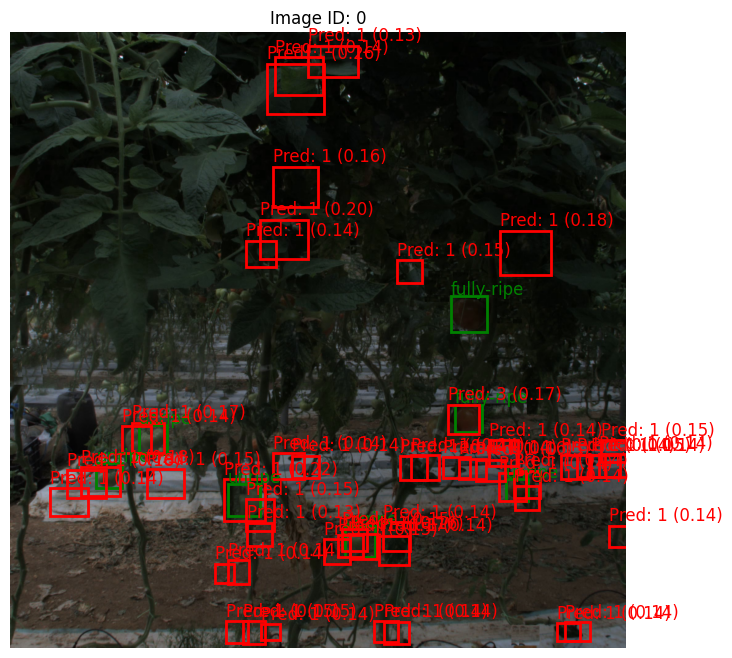

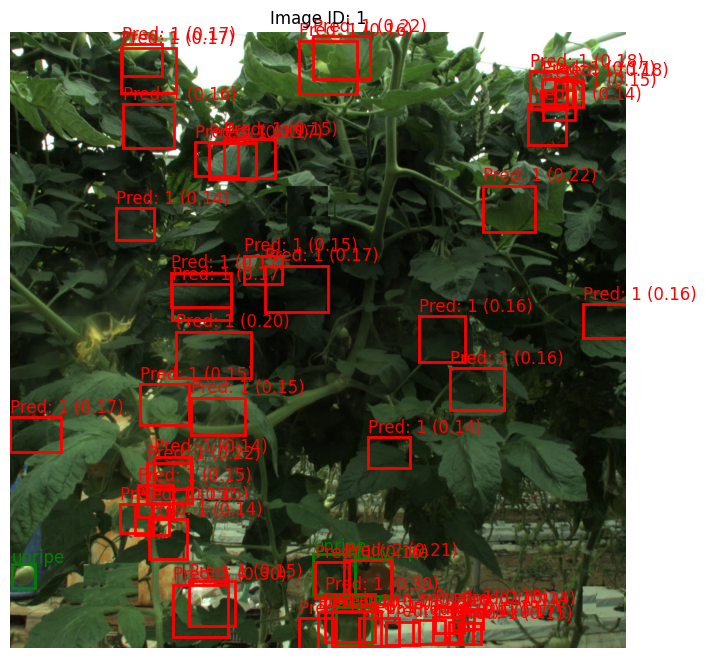

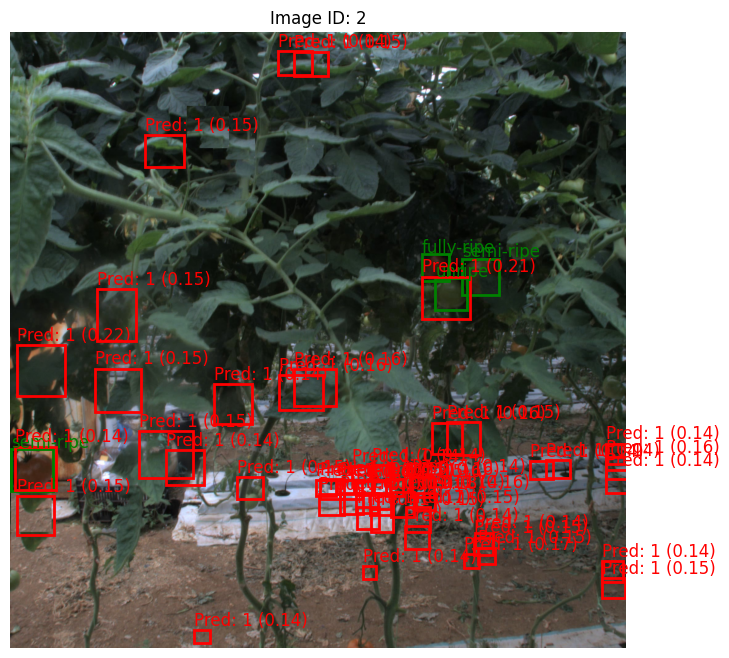

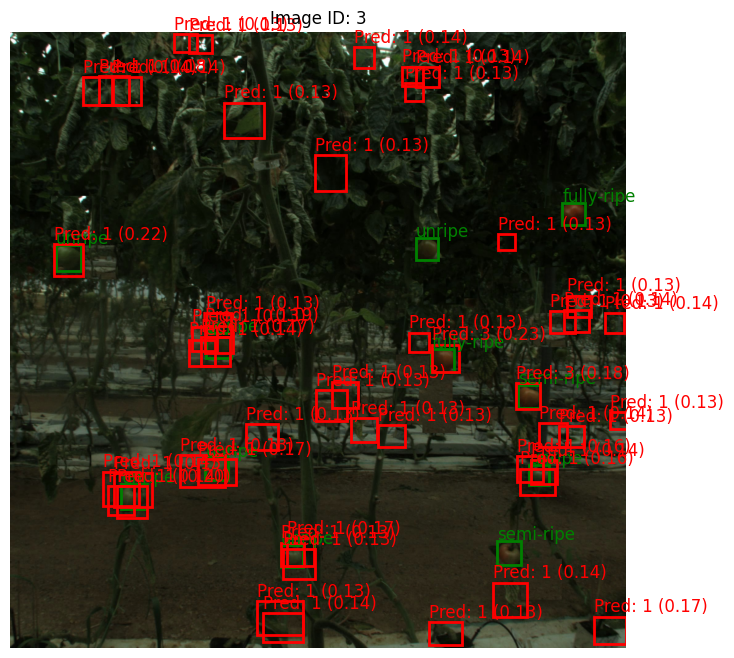

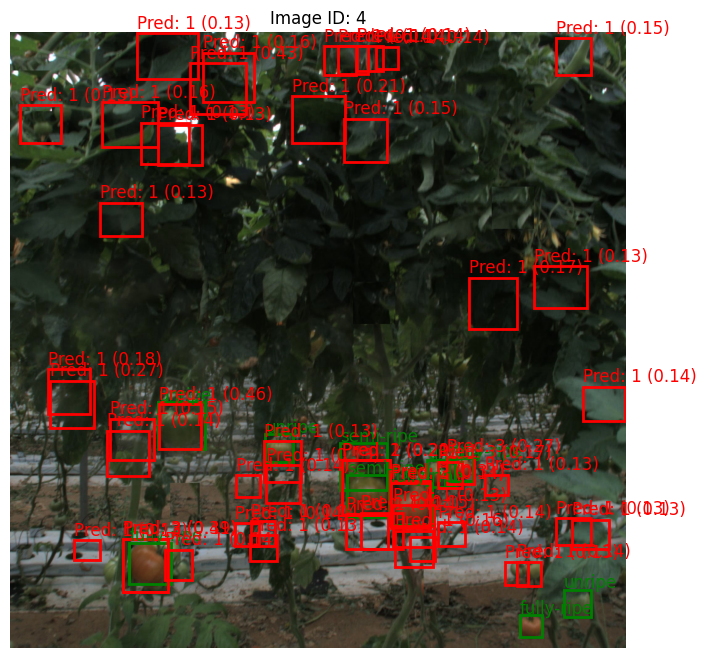

In [23]:
for x in range(5):
    visualize_image(image_ids[x])  # Visualize the first image

In [25]:
print("Categories:", coco_gt.dataset["categories"])

unique_category_ids = set([d["category_id"] for d in detections])
print("Unique Category IDs in Detections:", unique_category_ids)


Categories: [{'supercategory': 'tomato', 'id': 1, 'name': 'unripe'}, {'supercategory': 'tomato', 'id': 2, 'name': 'semi-ripe'}, {'supercategory': 'tomato', 'id': 3, 'name': 'fully-ripe'}]
Unique Category IDs in Detections: {1, 2, 3}


In [27]:
from pycocotools import mask
import numpy as np

def visualize_image(image_id, show_correct_only=False, iou_threshold=0.5):
    """
    Visualize the detections and ground truth for a specific image.
    
    Args:
        image_id: The ID of the image to visualize.
        show_correct_only (bool): If True, only display correct predictions.
        iou_threshold (float): IoU threshold to determine correct predictions.
    """
    # Load image metadata
    img_info = coco_gt.loadImgs(image_id)[0]
    img_path = os.path.join(images_dir, img_info["file_name"])
    
    # Load and display the image
    img = plt.imread(img_path)
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.axis("off")
    
    # Create a plot
    ax = plt.gca()

    # Plot ground truth annotations
    ann_ids = coco_gt.getAnnIds(imgIds=image_id)
    anns = coco_gt.loadAnns(ann_ids)
    gt_bboxes = [ann["bbox"] for ann in anns]
    gt_categories = [ann["category_id"] for ann in anns]

    for ann in anns:
        bbox = ann["bbox"]
        x, y, width, height = bbox
        rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor="green", facecolor="none")
        ax.add_patch(rect)
        plt.text(x, y - 5, coco_gt.loadCats(ann["category_id"])[0]["name"], color="green", fontsize=12)

    # Plot detections
    for det in detections:
        if det["image_id"] == image_id:
            bbox = det["bbox"]
            x, y, width, height = bbox
            score = det["score"]
            category_id = det["category_id"]

            # Calculate IoU with all ground truth boxes
            if show_correct_only:
                matched = False
                for gt_bbox, gt_category in zip(gt_bboxes, gt_categories):
                    if category_id == gt_category:  # Check if the category matches
                        iou = calculate_iou(bbox, gt_bbox)
                        if iou >= iou_threshold:
                            matched = True
                            break
                if not matched:
                    continue  # Skip incorrect predictions

            # Draw the detection
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor="red", facecolor="none")
            ax.add_patch(rect)
            plt.text(x, y - 15, f"Pred: {category_id} ({score:.2f})", color="red", fontsize=12)

    plt.title(f"Image ID: {image_id}")
    plt.show()


def calculate_iou(boxA, boxB):
    """
    Calculate the Intersection over Union (IoU) between two bounding boxes.

    Args:
        boxA: [x_min, y_min, width, height] for box A.
        boxB: [x_min, y_min, width, height] for box B.

    Returns:
        IoU value (float).
    """
    # Convert to x1, y1, x2, y2 format
    xA1, yA1, wA, hA = boxA
    xB1, yB1, wB, hB = boxB
    xA2, yA2 = xA1 + wA, yA1 + hA
    xB2, yB2 = xB1 + wB, yB1 + hB

    # Compute the intersection area
    xI1 = max(xA1, xB1)
    yI1 = max(yA1, yB1)
    xI2 = min(xA2, xB2)
    yI2 = min(yA2, yB2)
    interArea = max(0, xI2 - xI1) * max(0, yI2 - yI1)

    # Compute the union area
    boxAArea = (xA2 - xA1) * (yA2 - yA1)
    boxBArea = (xB2 - xB1) * (yB2 - yB1)
    unionArea = boxAArea + boxBArea - interArea

    # Compute the IoU
    return interArea / unionArea if unionArea > 0 else 0


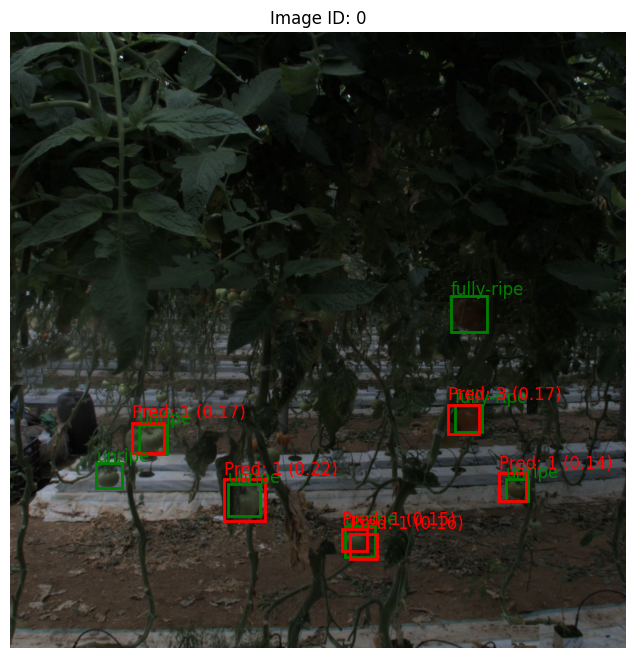

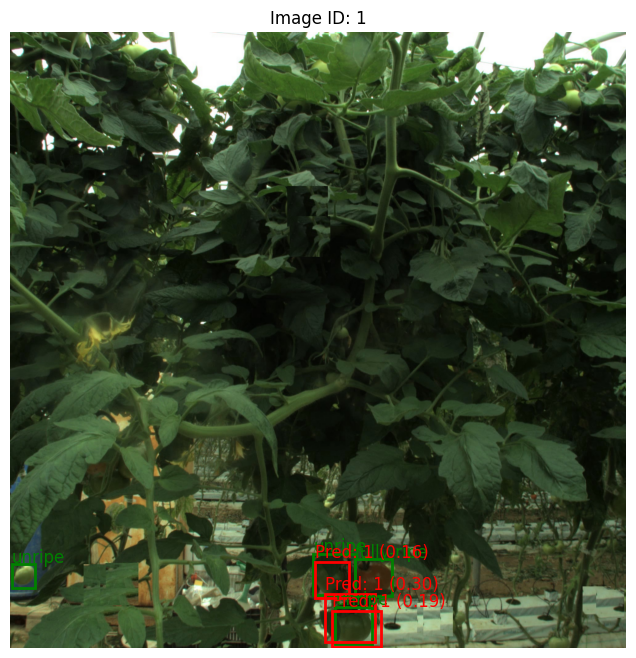

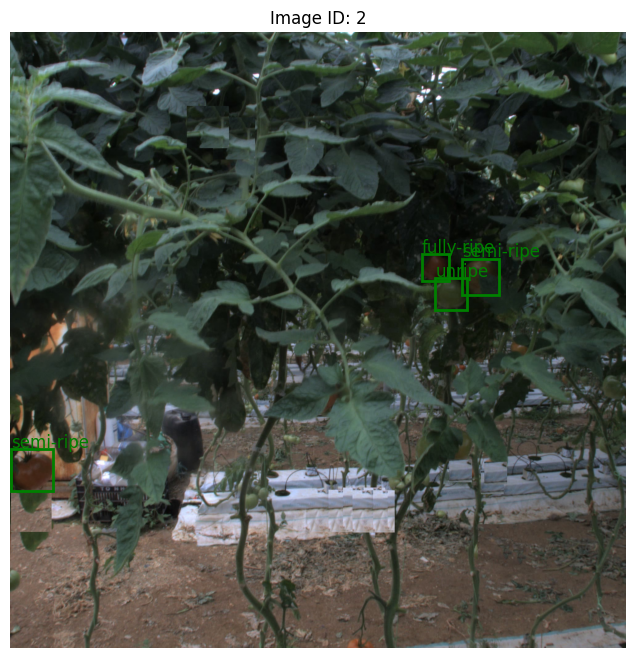

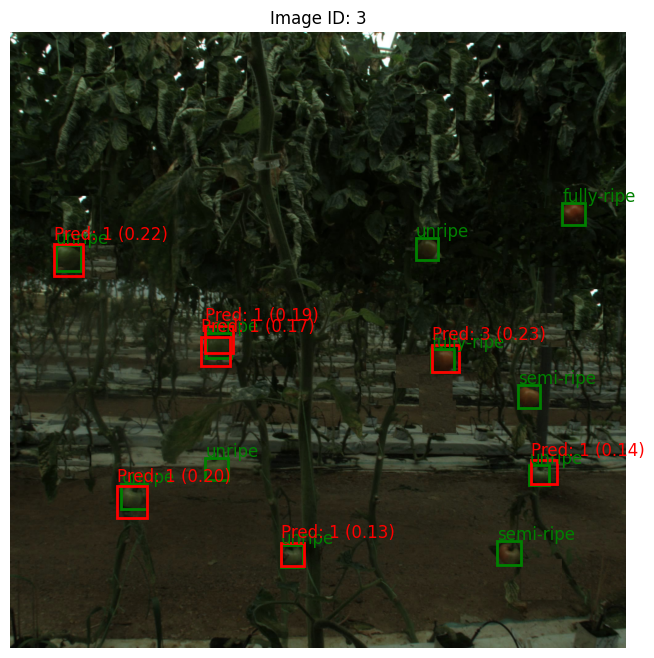

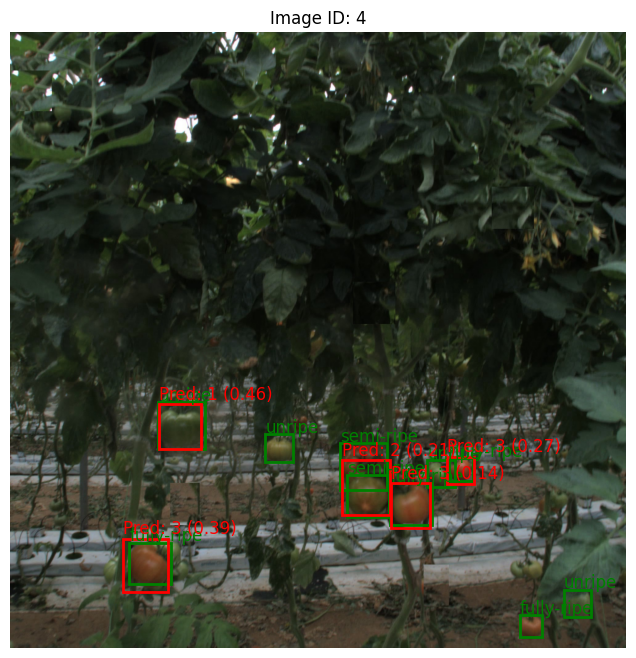

In [29]:
for i in range(5):
    visualize_image(image_ids[i], show_correct_only=True, iou_threshold=0.5)

## Results Visualization CCROP

In [58]:
import xml.etree.ElementTree as ET

# Function to parse XML annotation files
def load_ground_truth_annotations(annotation_folder):
    gt_dict = {}

    for filename in os.listdir(annotation_folder):
        if filename.endswith(".xml"):
            image_id = filename[:-4]  # Remove .xml extension
            file_path = os.path.join(annotation_folder, filename)

            tree = ET.parse(file_path)
            root = tree.getroot()

            gt_dict[image_id] = []
            for obj in root.findall("object"):
                bbox = obj.find("bndbox")
                xmin = int(bbox.find("xmin").text)
                ymin = int(bbox.find("ymin").text)
                xmax = int(bbox.find("xmax").text)
                ymax = int(bbox.find("ymax").text)

                gt_dict[image_id].append([xmin, ymin, xmax, ymax])

    return gt_dict

# Path to annotations folder
annotation_folder = "data/Datasets/CCROP/Annotations"  # Update with correct folder
ground_truth_dict = load_ground_truth_annotations(annotation_folder)

# Print a sample to verify
print(f"Loaded ground truth for {len(ground_truth_dict)} images")
print(ground_truth_dict[list(ground_truth_dict.keys())[0]])  # First image's annotations


Loaded ground truth for 4179 images
[[228, 123, 265, 196], [61, 209, 92, 288], [89, 272, 114, 302], [118, 233, 136, 273]]


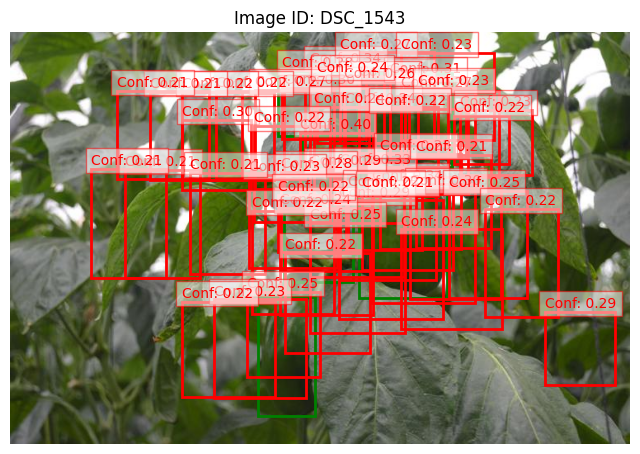

In [68]:
def visualize_with_ground_truth(image_folder, detections_dict, ground_truth_dict, image_id):
    image_path = os.path.join(image_folder, f"{image_id}.jpg")

    # Load image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_path} not found!")
        return

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

    # Plot image
    plt.figure(figsize=(8, 6))
    plt.imshow(image)

    # Draw Ground Truth boxes in Green
    if image_id in ground_truth_dict:
        for gt_bbox in ground_truth_dict[image_id]:
            xmin, ymin, xmax, ymax = gt_bbox
            plt.gca().add_patch(plt.Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                fill=False, edgecolor='green', linewidth=2, label="Ground Truth"
            ))

    # Draw Detection boxes in Red
    if image_id in detections_dict:
        for det in detections_dict[image_id]:
            xmin, ymin, xmax, ymax = det["bbox"]
            label = f"Conf: {det['confidence']:.2f}"

            plt.gca().add_patch(plt.Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                fill=False, edgecolor='red', linewidth=2, label="Detection"
            ))

            plt.text(xmin, ymin - 5, label, fontsize=10, color='red',
                     bbox=dict(facecolor='white', alpha=0.5, edgecolor='red'))

    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

# Example usage:
image_folder = "data/Datasets/CCROP/JPegImages"  # Adjust this
sample_image_id = list(detections_dict.keys())[0]  # Pick a detected image

visualize_with_ground_truth(image_folder, detections_dict, ground_truth_dict, sample_image_id)


In [130]:
# Modify paths below

json_file_path = "tests/5ccrop/detections.json"  # Update with actual path
image_folder_path = "data/Datasets/CCROP/JPegImages"  # Update with correct folder
index_to_visualize = 0  # Change this to view different images
iou_threshold = 0.5  # Adjust as needed

# Ensure ground truth annotations are loaded
if 'ground_truth_dict' not in globals():
    annotation_folder = "data/Datasets/CCROP/Annotations"  # Update path if needed
    ground_truth_dict = load_ground_truth_annotations(annotation_folder)

In [126]:
# Function to visualize detections and ground truth boxes with updated color scheme
def visualize_detections_with_gt(image_folder, json_file, ground_truth_dict, index=0, use_iou_threshold=False, iou_threshold=0.5):
    """
    Visualizes detections from JSON along with ground truth annotations.
    If IoU threshold filtering is enabled, it hides detections that do not meet the threshold.
    When IoU filtering is disabled, it applies a color scheme:
      - Green: Ground Truth
      - Blue: Detections that meet IoU threshold
      - Red: Other detections

    Args:
        image_folder (str): Path to the folder containing images.
        json_file (str): Path to the detections.json file.
        ground_truth_dict (dict): Dictionary containing ground truth annotations.
        index (int): The index of the image to visualize.
        use_iou_threshold (bool): Whether to apply IoU filtering or not.
        iou_threshold (float): Minimum IoU threshold for displaying detections (only used if use_iou_threshold=True).
    """
    # Load detections
    detections_dict = load_detections_from_json(json_file)

    # Get all image IDs
    image_ids = list(detections_dict.keys())

    # Ensure the index is within range
    if index < 0 or index >= len(image_ids):
        print(f"Index {index} out of range! Available range: 0 - {len(image_ids) - 1}")
        return

    # Select image ID based on index
    image_id = image_ids[index]
    print(f"Visualizing Image ID: {image_id}")

    image_path = os.path.join(image_folder, f"{image_id}.jpg")

    # Load image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_path} not found!")
        return

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

    # Plot image
    plt.figure(figsize=(8, 6))
    plt.imshow(image)

    valid_detections = []
    other_detections = []

    # Draw Ground Truth boxes in Green
    if image_id in ground_truth_dict:
        for gt_bbox in ground_truth_dict[image_id]:
            plt.gca().add_patch(plt.Rectangle(
                (gt_bbox[0], gt_bbox[1]), gt_bbox[2] - gt_bbox[0], gt_bbox[3] - gt_bbox[1],
                fill=False, edgecolor='green', linewidth=2  # Green for GT
            ))
            plt.text(gt_bbox[0], gt_bbox[1] - 5, "Ground Truth", fontsize=10, color='green',
                     bbox=dict(facecolor='white', alpha=0.5, edgecolor='green'))

    # Process detections
    if image_id in detections_dict:
        for det in detections_dict[image_id]:
            xmin, ymin, xmax, ymax = det["bbox"]
            confidence = det["confidence"]
            class_name = det["class"]

            # If IoU filtering is enabled, check IoU before adding to valid detections
            if use_iou_threshold:
                valid = False
                if image_id in ground_truth_dict:
                    for gt_bbox in ground_truth_dict[image_id]:
                        iou = compute_iou(det["bbox"], gt_bbox)
                        if iou >= iou_threshold:
                            valid = True
                            break  # Stop checking once we find a valid IoU match

                if valid:
                    valid_detections.append(det)
            else:
                # If IoU filtering is disabled, check if detection meets IoU threshold
                valid = False
                if image_id in ground_truth_dict:
                    for gt_bbox in ground_truth_dict[image_id]:
                        iou = compute_iou(det["bbox"], gt_bbox)
                        if iou >= iou_threshold:
                            valid = True
                            break

                if valid:
                    valid_detections.append(det)  # Store in valid detections (Blue)
                else:
                    other_detections.append(det)  # Store in other detections (Red)

    # Draw detections that meet IoU threshold in Blue
    for det in valid_detections:
        xmin, ymin, xmax, ymax = det["bbox"]
        confidence = det["confidence"]
        class_name = det["class"]

        label = f"{class_name} ({confidence:.2f})"

        plt.gca().add_patch(plt.Rectangle(
            (xmin, ymin), xmax - xmin, ymax - ymin,
            fill=False, edgecolor='blue', linewidth=2  # Blue for valid detections
        ))

        plt.text(xmin, ymin - 5, label, fontsize=10, color='blue',
                 bbox=dict(facecolor='white', alpha=0.5, edgecolor='blue'))

    # Draw other detections that do not meet IoU threshold in Red
    for det in other_detections:
        xmin, ymin, xmax, ymax = det["bbox"]
        confidence = det["confidence"]
        class_name = det["class"]

        label = f"{class_name} ({confidence:.2f})"

        plt.gca().add_patch(plt.Rectangle(
            (xmin, ymin), xmax - xmin, ymax - ymin,
            fill=False, edgecolor='red', linewidth=2  # Red for detections that don't meet IoU
        ))

        plt.text(xmin, ymin - 5, label, fontsize=10, color='red',
                 bbox=dict(facecolor='white', alpha=0.5, edgecolor='red'))

    plt.title(f"Detections & Ground Truth for Image ID: {image_id}")  # Display image ID as title
    plt.axis("off")
    plt.show()


Visualizing Image ID: DSC_1543


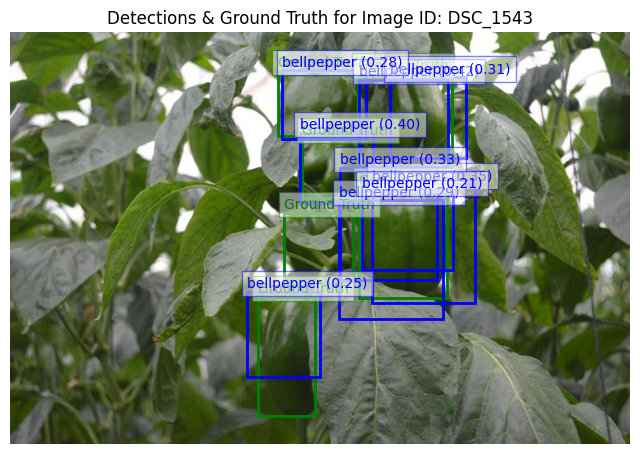

In [132]:
# Run visualization with optional IoU filtering
visualize_detections_with_gt(image_folder_path, json_file_path, ground_truth_dict, index_to_visualize, True, iou_threshold)

Visualizing Image ID: DSC_1543


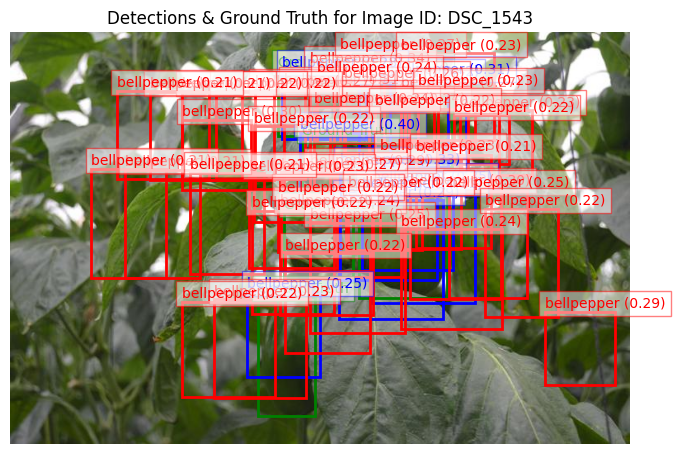

In [134]:
# Run visualization without IoU filtering
visualize_detections_with_gt(image_folder_path, json_file_path, ground_truth_dict, index_to_visualize, False, iou_threshold)

## CamoCrops Preprocessing

In [145]:
import os

def save_filenames_to_txt(folder_path, output_path):
    """
    Reads filenames from a specified folder, removes their extensions,
    and writes them into a specified text file.

    Args:
        folder_path (str): Path to the folder containing the files.
        output_path (str): Full path where the output text file should be saved.
    """
    if not os.path.exists(folder_path):
        print("Error: Folder does not exist.")
        return

    filenames = [os.path.splitext(f)[0] for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

    with open(output_path, "w") as file:
        file.write("\n".join(filenames))

    print(f"Successfully saved {len(filenames)} filenames to {output_path}")

In [143]:
# export imagesets text files 
save_filenames_to_txt("data/Datasets/CamoCrops/Annotations/test", "data/Datasets/CamoCrops/ImageSets/test.txt")
save_filenames_to_txt("data/Datasets/CamoCrops/Annotations/train", "data/Datasets/CamoCrops/ImageSets/train.txt")
save_filenames_to_txt("data/Datasets/CamoCrops/Annotations/val", "data/Datasets/CamoCrops/ImageSets/val.txt")

Successfully saved 698 filenames to data/Datasets/CamoCrops/ImageSets/test.txt
Successfully saved 10967 filenames to data/Datasets/CamoCrops/ImageSets/train.txt
Successfully saved 2735 filenames to data/Datasets/CamoCrops/ImageSets/val.txt
